# Water Pump failure Prediction

### Overview

Tanzania is a East African nation with over 57 million population. According to www.water.org, more 4 million people lack access to safe water and >30 million people dont' have access to improved sanitation. Because, the country developemnt and population growing, the demand for safe water is also rising. Between 1960 - 2013, more than 60,000 water pumps have been constructed and almost half of them are not functioning anymore or on the brink of failure. Tanzanian Ministry of Water and Taarifa has identified pumps that are functioning and not functioning or needs repair. Base on these data, Tanzanian Government want to find unidentified water pumps that are prone to failure.

### Problem Statement

Tanzanian Ministry of Water wants invest X amount of money on improving the water supply in their country. In order to do that, they want to identify the wells that needs immediate attention. They want to find out the number of wells from a newly collected test sites that are dysfunctional or needs repairs. Based on this, they want to focus on the following issues:

1. Identify region with large number of non-functioning water pump
2. Prioritize the region large group of people is being affected from the failed pumps. 
3. Identify the attribute types of the pumps that led to most of the failures

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline
sns.set_theme(style='darkgrid')

import sklearn
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from imblearn.over_sampling import SMOTENC

import xgboost as XGB
from xgboost import XGBClassifier

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn import metrics
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.metrics import roc_curve, auc
from sklearn import set_config
set_config(display='diagram')

import os
import warnings
warnings.filterwarnings(action='ignore')

### Data Loading 

In [31]:
submission = pd.read_csv('data/SubmissionFormat.csv')
test = pd.read_csv('data/Test_set_values.csv')
train  = pd.read_csv('data/Training_set_values.csv')
target = pd.read_csv('data/Training_set_labels.csv')

# Merging the target features for initial exploration
df = pd.merge(train, target, on = 'id')

In [3]:
def location_map(df, color, title):
    fig = px.scatter_mapbox(df, lat="latitude", lon="longitude",
                           #size = None,
                            color = color,
                            size_max = 5,
                            zoom = 5,
                            height = 600,
                            title = title,
                            hover_data = {'region':True,
                                         'construction_year':True,
                                         }
                           )
    fig.update_layout(mapbox_style ="carto-positron")
    fig.show()

In [4]:
location_map(df, 'status_group', title='Water Pump Status in Tanzania')

#### Water pump construction 

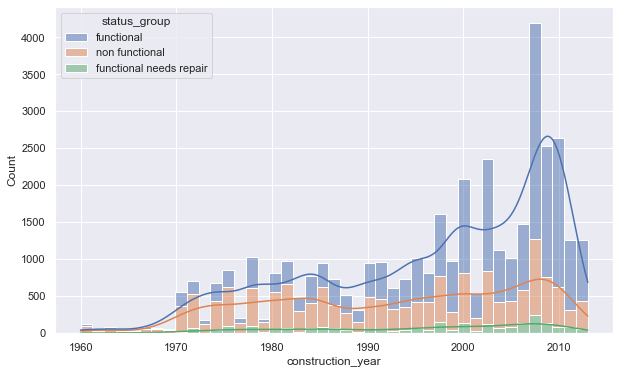

In [5]:
fig, ax = plt.subplots(figsize=(10,6))
ax = sns.histplot(data = df.loc[df['construction_year']>0],
             x = 'construction_year',
             hue = 'status_group', multiple = 'stack', kde = True)
plt.savefig('images/water_pump_status_by_construction_year.png', bbox_inces='tight')

There has been steady growth in construction of water pump until 2007 and after that the new construction has been declining. There is also slight increase in non-functional wells in the last decade.

### Data Exploration

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55765 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59400 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

Most of the features are categorical. We need to make sure the number of unique categories in each feature is not very large which may result into a large number number of feature vectors after one-hot-encoding. Below, we will evaluate the unique categories associated with each feature columns.

In [8]:
# Evaluate unique categories for categorical columns
uniq_categories = {}
for column in list(df.columns):
    if df[column].dtype == 'object':
        uniq_categories[column] = len(df[column].unique())       
    else:
        pass
dict(sorted(uniq_categories.items(), key = lambda x : x[1]))

{'recorded_by': 1,
 'public_meeting': 3,
 'permit': 3,
 'source_class': 3,
 'status_group': 3,
 'management_group': 5,
 'quantity': 5,
 'quantity_group': 5,
 'quality_group': 6,
 'waterpoint_type_group': 6,
 'extraction_type_class': 7,
 'payment': 7,
 'payment_type': 7,
 'source_type': 7,
 'waterpoint_type': 7,
 'water_quality': 8,
 'basin': 9,
 'source': 10,
 'management': 12,
 'scheme_management': 13,
 'extraction_type_group': 13,
 'extraction_type': 18,
 'region': 21,
 'lga': 125,
 'date_recorded': 356,
 'funder': 1898,
 'ward': 2092,
 'installer': 2146,
 'scheme_name': 2697,
 'subvillage': 19288,
 'wpt_name': 37400}

We can see some of the features have thousands of categories within them. One-hot-encoding will not be efficient way for modeling.A simple label encoding is usually not suggested for categorical features. We will drop these columns for now and see how the model performs. We will also drop some columns that may not contribute to the prediction. 

There are many features that may have redundant categories. For example, features like 'source', 'source_type', and 'source_class' seems to have same information. Some columns have redundant with added added details.

In [13]:
print('source:', df.source.unique())
print('\nsource_type:', df.source.unique())
print('\nsource_class:', df.source.unique())

source: ['spring' 'rainwater harvesting' 'dam' 'machine dbh' 'other'
 'shallow well' 'river' 'hand dtw' 'lake' 'unknown']

source_type: ['spring' 'rainwater harvesting' 'dam' 'machine dbh' 'other'
 'shallow well' 'river' 'hand dtw' 'lake' 'unknown']

source_class: ['spring' 'rainwater harvesting' 'dam' 'machine dbh' 'other'
 'shallow well' 'river' 'hand dtw' 'lake' 'unknown']


In [15]:
print('extraction_type:', df.extraction_type.unique())
print('\nextraction_type_group:', df.extraction_type_group.unique())

extraction_type: ['gravity' 'submersible' 'swn 80' 'nira/tanira' 'india mark ii' 'other'
 'ksb' 'mono' 'windmill' 'afridev' 'other - rope pump' 'india mark iii'
 'other - swn 81' 'other - play pump' 'cemo' 'climax' 'walimi'
 'other - mkulima/shinyanga']

extraction_type_group: ['gravity' 'submersible' 'swn 80' 'nira/tanira' 'india mark ii' 'other'
 'mono' 'wind-powered' 'afridev' 'rope pump' 'india mark iii'
 'other handpump' 'other motorpump']


These redundant features will be dropped from the current analysis.

### Target Class

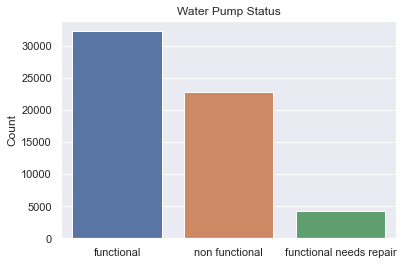

In [9]:
sns.countplot(data=df, x= 'status_group')
plt.title('Water Pump Status')
plt.xlabel('')
plt.ylabel('Count')
plt.savefig('images/water_pump_status_count.png')

The training data has three class labels. We can see there is a greater imbalance in the class label, we will see how this will affect the modeling performance later. 

### Missing data

In [10]:
df.isna().sum().sort_values()

id                           0
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
waterpoint_type_group        0
payment_type                 0
quality_group                0
quantity                     0
quantity_group               0
source                       0
source_type                  0
source_class                 0
waterpoint_type              0
water_quality                0
recorded_by                  0
status_group                 0
population                   0
amount_tsh                   0
date_recorded                0
gps_height                   0
longitude                    0
latitude                     0
wpt_name                     0
basin                        0
num_private                  0
region                       0
region_code                  0
district_code                0
lga     

Most of the features with large missing values will be dropped from the analysis because either they do not seem to contribute to modeling or they are redundant. Features like 'funder' and 'installer' may be important but due high cardinality, they will be dropped as well. 

Between 'scheme_management', 'management' and 'management_group', the latter seems to be high level. We will drop the first two. 

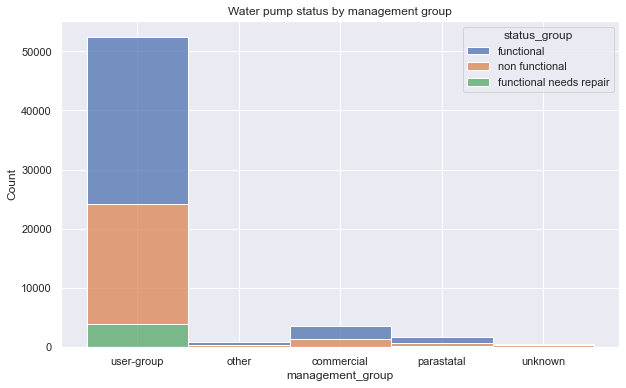

In [11]:
fig, ax = plt.subplots(figsize=(10,6))
ax = sns.histplot(data = df, x = 'management_group', 
             hue = 'status_group', multiple = 'stack', kde = False)
plt.title("Water pump status by management group");

Large proportion of water pumps are managed by user-group.

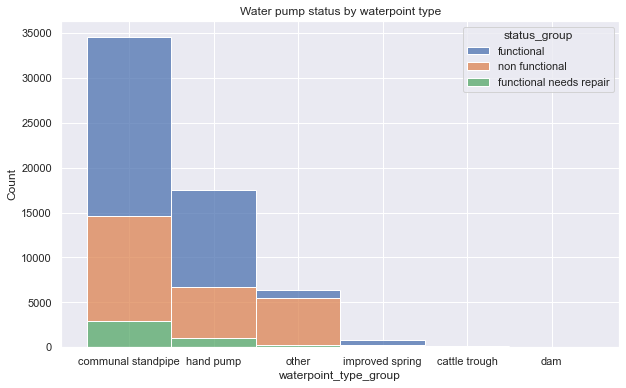

In [12]:
fig, ax = plt.subplots(figsize=(10,6))
ax = sns.histplot(data = df, x = 'waterpoint_type_group', 
             hue = 'status_group', multiple = 'stack', kde = False)
plt.title("Water pump status by waterpoint type");

Large proportion of non-functioning pump belongs to 'communal standpipe'. Many Hand pumps are also on the non-functioning.

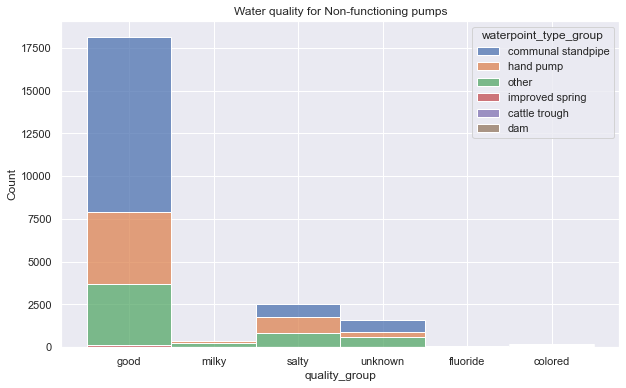

In [13]:
fig, ax = plt.subplots(figsize=(10,6))
ax = sns.histplot(data = df.loc[df['status_group']=='non functional'], x = 'quality_group', 
             hue = 'waterpoint_type_group', multiple = 'stack', kde = False)
plt.title("Water quality for Non-functioning pumps");

Water quality may not be associated with the pump failure as majority of non functioning pumps have good source of water.

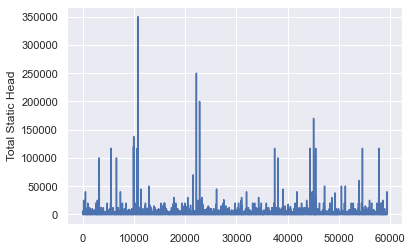

In [14]:
# amount_tsh is the total static head left in the well.
df.amount_tsh.loc[lambda x: x > 0].plot()
plt.ylabel('Total Static Head');

The higher head means water available for pump to draw. We can see, only few of the wells have higher static head. 

### Prepare for modelling

Feature which have high cardinality and redundancy will be dropped from the modeling. Some features which may not contribute to the prediction will also be dropped from the analysis. 

In [6]:
cols_large_categ =  ['lga', 'date_recorded', 'funder', 'ward', 'installer', 
                     'scheme_name', 'subvillage', 'wpt_name'] 

numeric_cols_to_drop = ['num_private', 'region_code', 'district_code', 'latitude',
                       'longitude', 'id']

redundant_cols = ['quantity', 'water_quality', 'management', 'scheme_management', 'waterpoint_type', 
                     'source', 'source_type', 'payment']

cols_to_drop = cols_large_categ + numeric_cols_to_drop + redundant_cols

In [7]:
X = train.copy(deep=True)
y = target['status_group']

In [8]:
X.drop(cols_to_drop, axis=1, inplace=True)
X.head()

,amount_tsh,gps_height,basin,region,population,public_meeting,recorded_by,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management_group,payment_type,quality_group,quantity_group,source_class,waterpoint_type_group
0,6000.0,1390,Lake Nyasa,Iringa,109,True,GeoData Consultants Ltd,False,1999,gravity,gravity,gravity,user-group,annually,good,enough,groundwater,communal standpipe
1,0.0,1399,Lake Victoria,Mara,280,NaN,GeoData Consultants Ltd,True,2010,gravity,gravity,gravity,user-group,never pay,good,insufficient,surface,communal standpipe
2,25.0,686,Pangani,Manyara,250,True,GeoData Consultants Ltd,True,2009,gravity,gravity,gravity,user-group,per bucket,good,enough,surface,communal standpipe
3,0.0,263,Ruvuma / Southern Coast,Mtwara,58,True,GeoData Consultants Ltd,True,1986,submersible,submersible,submersible,user-group,never pay,good,dry,groundwater,communal standpipe
4,0.0,0,Lake Victoria,Kagera,0,True,GeoData Consultants Ltd,True,0,gravity,gravity,gravity,other,never pay,good,seasonal,surface,communal standpipe


In [9]:
numeric_cols = [col for col in X.columns if
                  X[col].dtype in ['int64', 'float64']]
categoric_cols = [col for col in X.columns if X[col].dtype == 'object']

In [10]:
# Encoding class label by numeric.
label_encoder = {'functional': 1,
                 'non functional': 0,
                 'functional needs repair':2}
y = y.map(label_encoder)

In [11]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((44550, 18), (14850, 18), (44550,), (14850,))

In [12]:
# some helper functions
def get_prediction(model, X_train, X_test, y_train, y_test):
    '''
    A simple function to make prediction on training and test set and 
    create a simple classificatin report
    
    '''
    y_train_pred = model.predict(X_train)
    y_test_pred  = model.predict(X_test)
    
    print('Training Prediction')
    print('--------------------')
    print(classification_report(y_train, y_train_pred))
    print('Test Prediction')
    print('--------------------')
    print(classification_report(y_test, y_test_pred))  
        
    return y_train_pred, y_test_pred   


def get_feature_names(column_transformer):
    """Get feature names from all transformers.
    Returns
    -------
    feature_names : list of strings
        Names of the features produced by transform.
    """
    # Remove the internal helper function
    #check_is_fitted(column_transformer)
    # Turn loopkup into function for better handling with pipeline later
    def get_names(trans):
        # >> Original get_feature_names() method
        if trans == 'drop' or (
                hasattr(column, '__len__') and not len(column)):
            return []
        if trans == 'passthrough':
            if hasattr(column_transformer, '_df_columns'):
                if ((not isinstance(column, slice))
                        and all(isinstance(col, str) for col in column)):
                    return column
                else:
                    return column_transformer._df_columns[column]
            else:
                indices = np.arange(column_transformer._n_features)
                return ['x%d' % i for i in indices[column]]
        if not hasattr(trans, 'get_feature_names'):
        # >>> Change: Return input column names if no method avaiable
            # Turn error into a warning
            warnings.warn("Transformer %s (type %s) does not "
                                 "provide get_feature_names. "
                                 "Will return input column names if available"
                                 % (str(name), type(trans).__name__))
            # For transformers without a get_features_names method, use the input
            # names to the column transformer
            if column is None:
                return []
            else:
                return [name + "__" + f for f in column]
        return [name + "__" + f for f in trans.get_feature_names()]
    ### Start of processing
    feature_names = []
    # Allow transformers to be pipelines. Pipeline steps are named differently, so preprocessing is needed
    if type(column_transformer) == sklearn.pipeline.Pipeline:
        l_transformers = [(name, trans, None, None) for step, name, trans in column_transformer._iter()]
    else:
        # For column transformers, follow the original method
        l_transformers = list(column_transformer._iter(fitted=True))
    for name, trans, column, _ in l_transformers: 
        if type(trans) == sklearn.pipeline.Pipeline:
            # Recursive call on pipeline
            _names = get_feature_names(trans)
            # if pipeline has no transformer that returns names
            if len(_names)==0:
                _names = [name + "__" + f for f in column]
            feature_names.extend(_names)
        else:
            feature_names.extend(get_names(trans))
    return feature_names



def plot_feature_importances(model, feature_names):
    '''
    A simple function to create a feature imporatnce graph from tree based model.
    Input : model (if inside pipeline, input as: pipeline_dtree['model'], 
            feature_names (if used pipeline, input as: get_feature_names(pipeline_dtree['preprocessor'])
    Output: Feature importance graph
    '''
    
    feature_importances = model.feature_importances_
    sorted_idx = feature_importances.argsort()
    #feature_names = get_feature_names(pipeline_rf['preprocessor'])
    plt.figure(figsize = (10, 20))
    plt.barh(feature_names, feature_importances[sorted_idx])
    plt.xlabel('Feature Importance')

## Pipelines

In [13]:
# Preprocessing for numerical data

numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(missing_values=np.nan, strategy = 'median')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data with One_hot_encoding

categorical_transformer1 = Pipeline(steps=[
   ('imputer', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
   ('onehot', OneHotEncoder(handle_unknown = 'error'))
])

# Bundle preprocessing for numerical and categorical data
preprocessor1 = ColumnTransformer(
                   transformers=[
                       ('num', numerical_transformer, numeric_cols),
                       ('cat', categorical_transformer1, categoric_cols)
                       ]
    )

In [23]:
# Instantiate a DecisionTreeClassifier Object
dtree = DecisionTreeClassifier(criterion = 'gini',
                             max_depth = 10,
                             max_features ='auto',
                             random_state = 42,
                             splitter ='best')

# Bundle preprocessing and modeling code in a pipeline
pipeline1_dtree = Pipeline(steps=[
    ('preprocessor', preprocessor1),
    ('model', dtree)
    ])

# Preprocessing of training data, fit model 
pipeline1_dtree.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['amount_tsh', 'gps_height',
                                                   'population',
                                                   'construction_year']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder())]),
                                                  ['basin', 'region',
                                                   'public_meeting',
                                                   'recorded_by', 'permit',
                                                   'extraction_type',
                                                   'extraction_type_group',
                                                   'extraction_type_class',
                                                   'management_group',
                                                   'payment_type',
                                                   'quality_group',
                                                   'quantity_group',
                                                   'source_class',
                                                   'waterpoint_type_group'])])),
                ('model',
                 DecisionTreeClassifier(max_depth=10, max_features='auto',
                                        random_state=42))])

In [24]:
# Get predictions (using helper function)
y_train_dtree, y_test_dtree = get_prediction(pipeline1_dtree, X_train, X_test,
                                                        y_train, y_test)

Training Prediction
--------------------
              precision    recall  f1-score   support

           0       0.76      0.59      0.66     17146
           1       0.69      0.88      0.78     24161
           2       0.58      0.07      0.13      3243

    accuracy                           0.71     44550
   macro avg       0.68      0.52      0.52     44550
weighted avg       0.71      0.71      0.69     44550

Test Prediction
--------------------
              precision    recall  f1-score   support

           0       0.73      0.58      0.65      5678
           1       0.69      0.87      0.77      8098
           2       0.49      0.06      0.11      1074

    accuracy                           0.70     14850
   macro avg       0.64      0.50      0.51     14850
weighted avg       0.69      0.70      0.68     14850



Our baseline model decistion tree produced a 65% accuracy on the test data. However, there is a significantly low recall value for the target pump that needs repair. This is due to high imbalance in class which needs to be addressed. But before that we would like to check other model will perform. In this case, we will test a Logistic Regression and Random Forest classifiers.

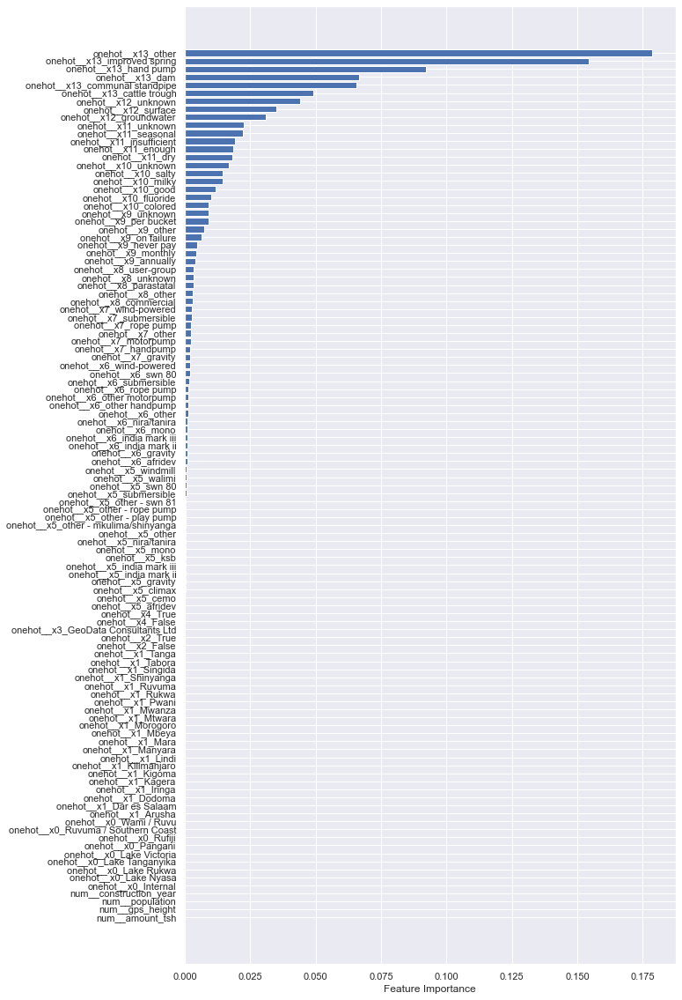

In [25]:
# using helper functions
plot_feature_importances(pipeline1_dtree['model'], get_feature_names(pipeline1_dtree['preprocessor']))

In [26]:
# Instantiate a Logistic Regression Object
logreg = LogisticRegression(solver = 'liblinear')

# Bundle preprocessing and modeling code in a pipeline
pipeline1_logreg = Pipeline(steps=[
    ('preprocessor', preprocessor1),
    ('model', logreg)
    ])

# Preprocessing of training data, fit model 
pipeline1_logreg.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['amount_tsh', 'gps_height',
                                                   'population',
                                                   'construction_year']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder())]),
                                                  ['basin', 'region',
                                                   'public_meeting',
                                                   'recorded_by', 'permit',
                                                   'extraction_type',
                                                   'extraction_type_group',
                                                   'extraction_type_class',
                                                   'management_group',
                                                   'payment_type',
                                                   'quality_group',
                                                   'quantity_group',
                                                   'source_class',
                                                   'waterpoint_type_group'])])),
                ('model', LogisticRegression(solver='liblinear'))])

In [27]:
# Get predictions
y_train_logreg, y_test_pred_logreg = get_prediction(pipeline1_logreg, X_train, X_test,
                                                        y_train, y_test)

Training Prediction
--------------------
              precision    recall  f1-score   support

           0       0.79      0.60      0.68     17146
           1       0.70      0.90      0.79     24161
           2       0.60      0.01      0.02      3243

    accuracy                           0.72     44550
   macro avg       0.69      0.50      0.49     44550
weighted avg       0.72      0.72      0.69     44550

Test Prediction
--------------------
              precision    recall  f1-score   support

           0       0.78      0.59      0.67      5678
           1       0.70      0.91      0.79      8098
           2       0.38      0.01      0.01      1074

    accuracy                           0.72     14850
   macro avg       0.62      0.50      0.49     14850
weighted avg       0.71      0.72      0.69     14850



The logistic regression performs almost same as decision tree with slight better accuracy. The class imabalance problems is reflected clearly in the modeling results. 

In [28]:
# Instantiate a Logistic Random Forest Object
rf = RandomForestClassifier(n_estimators = 100, random_state=0)

# Bundle preprocessing and modeling code in a pipeline
pipeline1_rf = Pipeline(steps=[
    ('preprocessor', preprocessor1),
    ('model', rf)
    ])

# Preprocessing of training data, fit model 
pipeline1_rf.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['amount_tsh', 'gps_height',
                                                   'population',
                                                   'construction_year']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder())]),
                                                  ['basin', 'region',
                                                   'public_meeting',
                                                   'recorded_by', 'permit',
                                                   'extraction_type',
                                                   'extraction_type_group',
                                                   'extraction_type_class',
                                                   'management_group',
                                                   'payment_type',
                                                   'quality_group',
                                                   'quantity_group',
                                                   'source_class',
                                                   'waterpoint_type_group'])])),
                ('model', RandomForestClassifier(random_state=0))])

In [29]:
# Get predictions
_,_ = get_prediction(pipeline1_rf, X_train, X_test, y_train, y_test)

Training Prediction
--------------------
              precision    recall  f1-score   support

           0       0.96      0.91      0.94     17146
           1       0.92      0.97      0.95     24161
           2       0.92      0.72      0.81      3243

    accuracy                           0.93     44550
   macro avg       0.93      0.87      0.90     44550
weighted avg       0.93      0.93      0.93     44550

Test Prediction
--------------------
              precision    recall  f1-score   support

           0       0.81      0.75      0.78      5678
           1       0.79      0.87      0.82      8098
           2       0.47      0.30      0.37      1074

    accuracy                           0.78     14850
   macro avg       0.69      0.64      0.66     14850
weighted avg       0.77      0.78      0.77     14850



The Random Forest model yielded a higher accuracy on the test data, but this model also suffers form huge over-fit problem as indicated by the differnce in training vs test scores: 93% to 78%. This means that the current default parameter may need to adjust to reduce such discrepancies. Lets check the feature importance map.

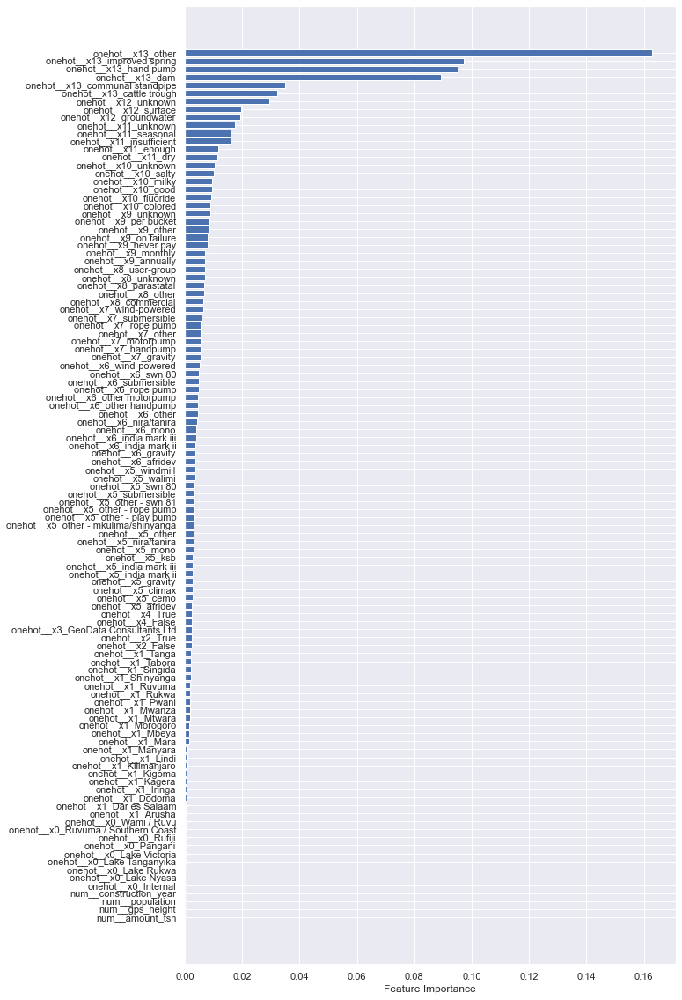

In [30]:
plot_feature_importances(pipeline1_rf['model'], get_feature_names(pipeline1_rf['preprocessor']))

The feature importance map indicated that the numerical features are not effective in predicting the pump status. However, one would expect features like static head, years constructed should be correlated to the durability of the pumps. 

In [44]:
# Instantiate a XGBoost classifier
# We will enable gpu for xgboost 
xgb = XGBClassifier(learning_rate =0.1, n_estimators=500, max_depth=10,
                    min_child_weight=1, gamma=0, subsample=0.6, 
                    colsample_bytree=0.6, reg_alpha=0, reg_lambda=1, 
                    objective='multi:softmax', nthread=os.cpu_count(), 
                    tree_method='gpu_hist', seed=100)

# Bundle preprocessing and modeling code in a pipeline
pipeline1_xgb = Pipeline(steps=[
    ('preprocessor', preprocessor1),
    ('model', xgb)
    ])

# Preprocessing of training data, fit model 
pipeline1_xgb.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['amount_tsh', 'gps_height',
                                                   'population',
                                                   'construction_year']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder())]),
                                                  ['basin', 'region',
                                                   'pub...
                               monotone_constraints='(0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0)',
                               n_estimators=500, n_jobs=8, nthread=8,
                               num_parallel_tree=1, objective='multi:softprob',
                               random_state=100, reg_alpha=0, reg_lambda=1,
                               scale_pos_weight=None, seed=100, subsample=0.6,
                               tree_method='gpu_hist', validate_parameters=1,
                               verbosity=None))])

In [45]:
# Get predictions
_, _ = get_prediction(pipeline1_xgb, X_train, X_test, y_train, y_test)

Training Prediction
--------------------
              precision    recall  f1-score   support

           0       0.93      0.88      0.91     17146
           1       0.89      0.96      0.92     24161
           2       0.88      0.61      0.72      3243

    accuracy                           0.90     44550
   macro avg       0.90      0.82      0.85     44550
weighted avg       0.90      0.90      0.90     44550

Test Prediction
--------------------
              precision    recall  f1-score   support

           0       0.82      0.76      0.79      5678
           1       0.79      0.88      0.83      8098
           2       0.49      0.28      0.36      1074

    accuracy                           0.79     14850
   macro avg       0.70      0.64      0.66     14850
weighted avg       0.78      0.79      0.78     14850



The XGBoost model reduces the training and test gap slightly. But it is still in the overfitting region. Next we need to address the issue of imbalanced class labels. Before that lets tune the model parameter for Random Forest to reduce the overfitting.

### Hyperparameter Tuning

All the hyperparameter tuning test are in Appendix. Below we will use the optimum parameters from the test2: 

rf_test2 = RandomForestClassifier(n_estimators = 500,
                                   max_depth = 30,
                                   min_samples_leaf = 1,
                                   min_samples_split = 10, random_state=0)

In [51]:
# Instantiate a Random Forest Object
rf_opt = RandomForestClassifier(n_estimators = 500, 
                            max_depth=30,
                            min_samples_leaf=1,
                            min_samples_split=10,
                            random_state=0)

# Bundle preprocessing and modeling code in a pipeline
pipeline1_rf_opt = Pipeline(steps=[
    ('preprocessor', preprocessor1),
    ('model', rf_opt)
    ])

# Preprocessing of training data, fit model 
pipeline1_rf_opt.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['amount_tsh', 'gps_height',
                                                   'population',
                                                   'construction_year']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder())]),
                                                  ['basin', 'region',
                                                   'public_meeting',
                                                   'recorded_by', 'permit',
                                                   'extraction_type',
                                                   'extraction_type_group',
                                                   'extraction_type_class',
                                                   'management_group',
                                                   'payment_type',
                                                   'quality_group',
                                                   'quantity_group',
                                                   'source_class',
                                                   'waterpoint_type_group'])])),
                ('model',
                 RandomForestClassifier(max_depth=30, min_samples_split=10,
                                        n_estimators=500, random_state=0))])

In [53]:
# Get predictions
_,_ = get_prediction(pipeline1_rf_opt, X_train, X_test, y_train, y_test)

Training Prediction
--------------------
              precision    recall  f1-score   support

           0       0.91      0.82      0.86     17146
           1       0.83      0.95      0.89     24161
           2       0.79      0.36      0.50      3243

    accuracy                           0.86     44550
   macro avg       0.85      0.71      0.75     44550
weighted avg       0.86      0.86      0.85     44550

Test Prediction
--------------------
              precision    recall  f1-score   support

           0       0.83      0.74      0.78      5678
           1       0.78      0.90      0.83      8098
           2       0.55      0.24      0.33      1074

    accuracy                           0.79     14850
   macro avg       0.72      0.62      0.65     14850
weighted avg       0.78      0.79      0.78     14850



The optimum parameterized model is still have some training overfit, however significantly reduced from the unoptimized Random Forest model. We will introduce a class_weight to address the imbalance in the class feature.

In [56]:
# Instantiate a Logistic Random Forest Object
rf_opt2 = RandomForestClassifier(n_estimators = 500, 
                            max_depth=30,
                            min_samples_leaf=1,
                            min_samples_split=10,
                            class_weight = 'balanced',
                            random_state=0)

# Bundle preprocessing and modeling code in a pipeline
pipeline1_rf_opt2 = Pipeline(steps=[
    ('preprocessor', preprocessor1),
    ('model', rf_opt2)
    ])

# Preprocessing of training data, fit model 
pipeline1_rf_opt2.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['amount_tsh', 'gps_height',
                                                   'population',
                                                   'construction_year']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder())]),
                                                  ['basin', 'region',
                                                   'public_meeting',
                                                   'recorded_by', 'permit',
                                                   'extraction_type',
                                                   'extraction_type_group',
                                                   'extraction_type_class',
                                                   'management_group',
                                                   'payment_type',
                                                   'quality_group',
                                                   'quantity_group',
                                                   'source_class',
                                                   'waterpoint_type_group'])])),
                ('model',
                 RandomForestClassifier(class_weight='balanced', max_depth=30,
                                        min_samples_split=10, n_estimators=500,
                                        random_state=0))])

In [57]:
# Get predictions
_,_ = get_prediction(pipeline1_rf_opt2, X_train, X_test, y_train, y_test)

Training Prediction
--------------------
              precision    recall  f1-score   support

           0       0.91      0.83      0.87     17146
           1       0.91      0.82      0.86     24161
           2       0.42      0.91      0.58      3243

    accuracy                           0.83     44550
   macro avg       0.75      0.86      0.77     44550
weighted avg       0.87      0.83      0.84     44550

Test Prediction
--------------------
              precision    recall  f1-score   support

           0       0.82      0.74      0.78      5678
           1       0.83      0.76      0.79      8098
           2       0.28      0.59      0.38      1074

    accuracy                           0.74     14850
   macro avg       0.64      0.70      0.65     14850
weighted avg       0.78      0.74      0.76     14850



We can see the test accuracy has reduced significantly. Next we will perform a SMOTE, another way to handle the class imbalance and compare against the result above.

### Handling imbalanced class labels with SMOTE

In [61]:
# Run the preprocessor pipeline on X_train and X_test only, leave the target
# We need to get same column information on X_test data, but we won't perform SMOTE on X_test

X_train_preprocess = preprocessor1.fit_transform(X_train)  
X_test_preprocess = preprocessor1.transform(X_test)
X_train_df = pd.DataFrame(X_train_preprocess.todense(), columns = get_feature_names(preprocessor1))
X_test_df = pd.DataFrame(X_test_preprocess.todense(), columns = get_feature_names(preprocessor1))

In [65]:
cat_cols_index = []
for i, s in enumerate(get_feature_names(preprocessor1)):
    if s.startswith('onehot'):
        cat_cols_index.append(i)        

In [66]:
# Instantiate a SMOTENC object and fit it to the dataframe
smote = SMOTENC(categorical_features = cat_cols_index, sampling_strategy='not majority')
X_train_resampled, y_train_resampled = smote.fit_sample(X_train_df, y_train) 

In [67]:
# Previous original class distribution
print('Original class distribution: \n')
print(y.value_counts())

# Preview synthetic sample class distribution
print('-----------------------------------------')
print('Synthetic sample class distribution: \n')
print(pd.Series(y_train_resampled).value_counts()) 

Original class distribution: 

1    32259
0    22824
2     4317
Name: status_group, dtype: int64
-----------------------------------------
Synthetic sample class distribution: 

2    24161
1    24161
0    24161
Name: status_group, dtype: int64


In [69]:
# Instantiate a Random Forest Object
rf_opt3 = RandomForestClassifier(n_estimators = 500, 
                            max_depth=30,
                            min_samples_leaf=1,
                            min_samples_split=10,
                            random_state=0)

# Preprocessing of training data, fit model 
rf_opt3.fit(X_train_resampled, y_train_resampled)

RandomForestClassifier(max_depth=30, min_samples_split=10, n_estimators=500,
                       random_state=0)

In [70]:
# Get predictions
_,_ = get_prediction(rf_opt3, X_train_resampled, X_test_preprocess,
                                y_train_resampled, y_test)

Training Prediction
--------------------
              precision    recall  f1-score   support

           0       0.93      0.85      0.89     24161
           1       0.87      0.83      0.85     24161
           2       0.84      0.95      0.89     24161

    accuracy                           0.88     72483
   macro avg       0.88      0.88      0.88     72483
weighted avg       0.88      0.88      0.88     72483

Test Prediction
--------------------
              precision    recall  f1-score   support

           0       0.81      0.75      0.78      5678
           1       0.83      0.75      0.79      8098
           2       0.27      0.58      0.37      1074

    accuracy                           0.74     14850
   macro avg       0.64      0.69      0.65     14850
weighted avg       0.78      0.74      0.75     14850



The distance betwen Training and Test accuracy increased, resulting into overfit.
Especially, class 2 has very low accuracy.

### Lets check if we don't one hot encode, how the Random Forest will perfom

In [73]:
X_cat = X[categoric_cols].apply(lambda x: x.astype('category').cat.codes)
X_encode = X[numeric_cols].join(X_cat)
X_encode = X_encode.reindex(sorted(X_encode.columns), axis=1)
X_encode.head()

,amount_tsh,basin,construction_year,extraction_type,extraction_type_class,extraction_type_group,gps_height,management_group,payment_type,permit,population,public_meeting,quality_group,quantity_group,recorded_by,region,source_class,waterpoint_type_group
0,6000.0,1,1999,3,0,1,1390,4,0,0,109,1,2,1,0,3,0,1
1,0.0,4,2010,3,0,1,1399,4,2,1,280,-1,2,2,0,9,1,1
2,25.0,5,2009,3,0,1,686,4,5,1,250,1,2,1,0,8,1,1
3,0.0,7,1986,14,5,10,263,4,2,1,58,1,2,0,0,12,0,1
4,0.0,4,0,3,0,1,0,1,2,1,0,1,2,3,0,4,1,1


In [74]:
# Train-test split
X_train_enc, X_test_enc, y_train_enc, y_test_enc = train_test_split(X_encode, y, random_state=42)
X_train_enc.shape, X_test_enc.shape, y_train_enc.shape, y_test_enc.shape

((44550, 18), (14850, 18), (44550,), (14850,))

### Pipeline2

In [75]:
# Preprocessing for numerical data

numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(missing_values=np.nan, strategy = 'median')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data without one-hot_encoding

categorical_transformer2 = Pipeline(steps=[
   ('imputer', SimpleImputer(missing_values=np.nan, strategy='most_frequent'))   
])

# Bundle preprocessing for numerical and categorical data
preprocessor2 = ColumnTransformer(
                   transformers=[
                       ('num', numerical_transformer, numeric_cols),
                       ('cat', categorical_transformer2, categoric_cols)
                       ]
    )

In [77]:
# Instantiate a Logistic Random Forest Object
rf_enc = RandomForestClassifier(n_estimators = 500, 
                            max_depth=30,
                            min_samples_leaf=1,
                            min_samples_split=10,
                            random_state=0)

# Bundle preprocessing and modeling code in a pipeline
pipeline2_rf_enc = Pipeline(steps=[
    ('preprocessor', preprocessor2),
    ('model', rf_enc)
    ])

# Preprocessing of training data, fit model 
pipeline2_rf_enc.fit(X_train_enc, y_train_enc)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['amount_tsh', 'gps_height',
                                                   'population',
                                                   'construction_year']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['basin', 'region',
                                                   'public_meeting',
                                                   'recorded_by', 'permit',
                                                   'extraction_type',
                                                   'extraction_type_group',
                                                   'extraction_type_class',
                                                   'management_group',
                                                   'payment_type',
                                                   'quality_group',
                                                   'quantity_group',
                                                   'source_class',
                                                   'waterpoint_type_group'])])),
                ('model',
                 RandomForestClassifier(max_depth=30, min_samples_split=10,
                                        n_estimators=500, random_state=0))])

In [78]:
# Get predictions
_, _ = get_prediction(pipeline2_rf_enc, X_train_enc, X_test_enc, y_train_enc, y_test_enc)

Training Prediction
--------------------
              precision    recall  f1-score   support

           0       0.91      0.84      0.87     17146
           1       0.84      0.95      0.90     24161
           2       0.81      0.38      0.52      3243

    accuracy                           0.87     44550
   macro avg       0.85      0.72      0.76     44550
weighted avg       0.87      0.87      0.86     44550

Test Prediction
--------------------
              precision    recall  f1-score   support

           0       0.83      0.74      0.78      5678
           1       0.78      0.90      0.84      8098
           2       0.54      0.24      0.33      1074

    accuracy                           0.79     14850
   macro avg       0.72      0.63      0.65     14850
weighted avg       0.78      0.79      0.78     14850



We can see that there is almost no difference in prediction scores between Random Forest model with and without one hot encoding. The model with the label encoding, does give some importance to numerical data, but the 'num_amount_tsh' feature got zero importance in either case.

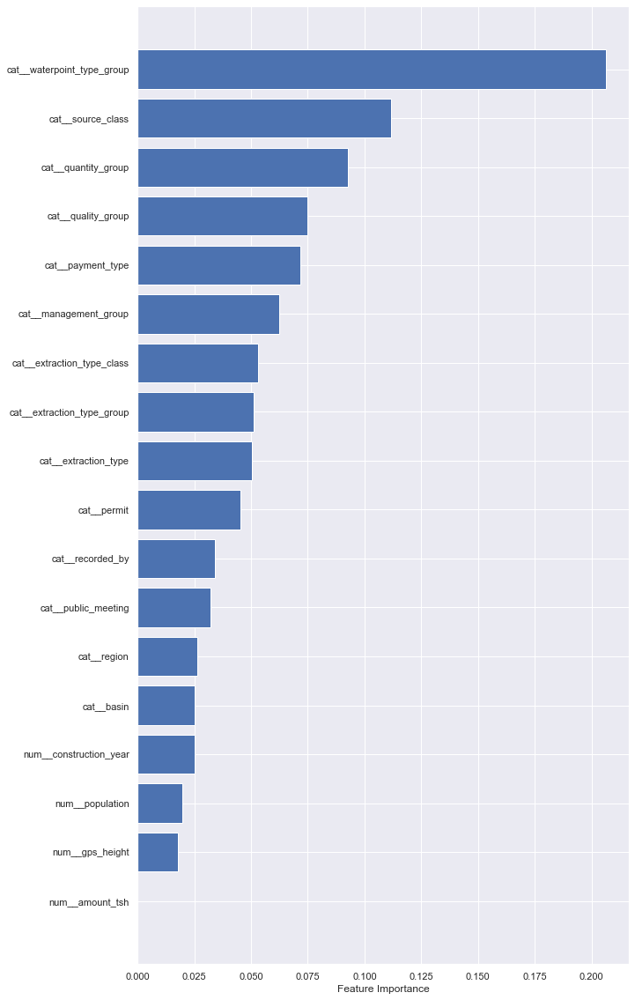

In [79]:
plot_feature_importances(pipeline2_rf_enc['model'], get_feature_names(pipeline2_rf_enc['preprocessor']))

In [80]:
# Instantiate a XGBoost classifier
xgb = XGBClassifier(learning_rate =0.1, n_estimators=500, max_depth=10,
                    min_child_weight=1, gamma=0, subsample=0.6, 
                    colsample_bytree=0.6, reg_alpha=0, reg_lambda=1, 
                    objective='multi:softmax', nthread=os.cpu_count(), 
                    tree_method='gpu_hist', seed=100)

# Bundle preprocessing and modeling code in a pipeline
pipeline2_xgb = Pipeline(steps=[
    ('preprocessor', preprocessor2),
    ('model', xgb)
    ])

# Preprocessing of training data, fit model 
pipeline2_xgb.fit(X_train_enc, y_train_enc)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['amount_tsh', 'gps_height',
                                                   'population',
                                                   'construction_year']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent'))]),
                                                  ['basin', 'region',
                                                   'public_meeting',
                                                   'recorded_by',...
                               max_delta_step=0, max_depth=10,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='(0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0)',
                               n_estimators=500, n_jobs=8, nthread=8,
                               num_parallel_tree=1, objective='multi:softprob',
                               random_state=100, reg_alpha=0, reg_lambda=1,
                               scale_pos_weight=None, seed=100, subsample=0.6,
                               tree_method='gpu_hist', validate_parameters=1,
                               verbosity=None))])

In [81]:
# Get predictions
_, _ = get_prediction(pipeline2_xgb, X_train_enc, X_test_enc, y_train_enc, y_test_enc)

Training Prediction
--------------------
              precision    recall  f1-score   support

           0       0.94      0.88      0.91     17146
           1       0.89      0.96      0.93     24161
           2       0.88      0.64      0.74      3243

    accuracy                           0.91     44550
   macro avg       0.90      0.83      0.86     44550
weighted avg       0.91      0.91      0.91     44550

Test Prediction
--------------------
              precision    recall  f1-score   support

           0       0.82      0.75      0.78      5678
           1       0.79      0.88      0.83      8098
           2       0.49      0.29      0.37      1074

    accuracy                           0.79     14850
   macro avg       0.70      0.64      0.66     14850
weighted avg       0.78      0.79      0.78     14850



We see similar result from XGBoost as well. One-hot-encoding will add complexity to the model by adding individual features for each category. It looks like there is not performance issue by adding that many complexities. However, in one-hot-encoding, the numerical features gets "zero" weight in modeling process where as label encoder seems to give some weight to them. One strange results to observe is that, the feature importances is following the order of encoding category, for instance, the importance is increasing with increasing the group number. 

###  Modeling with binary class labels

Most of the modeling effort has resulted into overfitting of the data and especially, there is no improvement on the 'recall' value for 'pump that needs repair'. This is due to the high imbalance in the class label. Even with the SMOTE implementation, we have not been able to reduce the overfit significantly. Since, the proportion of the pumps that needs repair feature is significantly low and also the fact that those pumps has to be fixed anyway, we will combine it with non-functioning class and create a binary class problem. In this case, the data will be more balanced and the model can perform better.

In [14]:
# Binary modelling with One-Hot-Encoding of Categorical variables
y = target['status_group']

label_encoder = {'functional': 1,
                 'non functional': 0,
                 'functional needs repair':0}
y_bin = y.map(label_encoder)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y_bin, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((44550, 18), (14850, 18), (44550,), (14850,))

In [15]:
# Instantiate a Random Forest Object
rf_bin = RandomForestClassifier(n_estimators = 500, 
                            max_depth=30,
                            min_samples_leaf=1,
                            min_samples_split=10,
                            random_state=0)

# Bundle preprocessing and modeling code in a pipeline
pipeline1_rf_bin = Pipeline(steps=[
    ('preprocessor', preprocessor1),
    ('model', rf_bin)
    ])

# Preprocessing of training data, fit model 
pipeline1_rf_bin.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['amount_tsh', 'gps_height',
                                                   'population',
                                                   'construction_year']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder())]),
                                                  ['basin', 'region',
                                                   'public_meeting',
                                                   'recorded_by', 'permit',
                                                   'extraction_type',
                                                   'extraction_type_group',
                                                   'extraction_type_class',
                                                   'management_group',
                                                   'payment_type',
                                                   'quality_group',
                                                   'quantity_group',
                                                   'source_class',
                                                   'waterpoint_type_group'])])),
                ('model',
                 RandomForestClassifier(max_depth=30, min_samples_split=10,
                                        n_estimators=500, random_state=0))])

In [16]:
# Get predictions
_, _ = get_prediction(pipeline1_rf_bin, X_train, X_test,y_train, y_test)

Training Prediction
--------------------
              precision    recall  f1-score   support

           0       0.91      0.82      0.86     20389
           1       0.86      0.94      0.90     24161

    accuracy                           0.88     44550
   macro avg       0.89      0.88      0.88     44550
weighted avg       0.88      0.88      0.88     44550

Test Prediction
--------------------
              precision    recall  f1-score   support

           0       0.82      0.73      0.77      6752
           1       0.79      0.87      0.83      8098

    accuracy                           0.81     14850
   macro avg       0.81      0.80      0.80     14850
weighted avg       0.81      0.81      0.80     14850



In [43]:
# Instantiate a XGBoost classifier
# We will enable gpu for xgboost 
xgb_bin = XGBClassifier(learning_rate =0.1, n_estimators=300, max_depth=10,
                    min_child_weight=1, gamma=0, subsample=0.6, 
                    colsample_bytree=0.6, reg_alpha=0, reg_lambda=1, 
                    objective='multi:softmax', num_class=2, nthread=os.cpu_count(), 
                    tree_method='gpu_hist', seed=100)

# Bundle preprocessing and modeling code in a pipeline
pipeline1_xgb_bin = Pipeline(steps=[
    ('preprocessor', preprocessor1),
    ('model', xgb_bin)
    ])

# Preprocessing of training data, fit model 
pipeline1_xgb_bin.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['amount_tsh', 'gps_height',
                                                   'population',
                                                   'construction_year']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder())]),
                                                  ['basin', 'region',
                                                   'pub...
                               monotone_constraints='(0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0)',
                               n_estimators=300, n_jobs=8, nthread=8,
                               num_class=2, num_parallel_tree=1,
                               objective='multi:softmax', random_state=100,
                               reg_alpha=0, reg_lambda=1, scale_pos_weight=None,
                               seed=100, subsample=0.6, tree_method='gpu_hist',
                               validate_parameters=1, verbosity=None))])

In [44]:
# Get predictions
_, _ = get_prediction(pipeline1_xgb_bin, X_train, X_test, y_train, y_test)

Training Prediction
--------------------
              precision    recall  f1-score   support

           0       0.92      0.84      0.88     20389
           1       0.88      0.94      0.91     24161

    accuracy                           0.89     44550
   macro avg       0.90      0.89      0.89     44550
weighted avg       0.90      0.89      0.89     44550

Test Prediction
--------------------
              precision    recall  f1-score   support

           0       0.82      0.74      0.78      6752
           1       0.80      0.86      0.83      8098

    accuracy                           0.81     14850
   macro avg       0.81      0.80      0.80     14850
weighted avg       0.81      0.81      0.81     14850



XGBoost also seems to overfit the training data. So far, the binary class label seems to provide a balanced fit of the model. If we think in terms of the water pump, the water pumps that needs to be repaired will have to be repaired any way. 

### Final Model
We see with optimized Random Forest and XGBoost is still overfitting. The max_depth parameter seems to be the most important in reducing the overfit. For our final model, we chose Random Forest with binary class label and implementation is below:

In [17]:
# Instantiate a Random Forest Object
rf_final = RandomForestClassifier(n_estimators = 500, 
                            max_depth=20,
                            min_samples_leaf=1,
                            min_samples_split=10,
                            random_state=0)

# Bundle preprocessing and modeling code in a pipeline
pipeline_rf_final = Pipeline(steps=[
    ('preprocessor', preprocessor1),
    ('model', rf_final)
    ])

# Preprocessing of training data, fit model 
pipeline_rf_final.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['amount_tsh', 'gps_height',
                                                   'population',
                                                   'construction_year']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder())]),
                                                  ['basin', 'region',
                                                   'public_meeting',
                                                   'recorded_by', 'permit',
                                                   'extraction_type',
                                                   'extraction_type_group',
                                                   'extraction_type_class',
                                                   'management_group',
                                                   'payment_type',
                                                   'quality_group',
                                                   'quantity_group',
                                                   'source_class',
                                                   'waterpoint_type_group'])])),
                ('model',
                 RandomForestClassifier(max_depth=20, min_samples_split=10,
                                        n_estimators=500, random_state=0))])

In [18]:
# Get predictions
_, _ = get_prediction(pipeline_rf_final, X_train, X_test,y_train, y_test)

Training Prediction
--------------------
              precision    recall  f1-score   support

           0       0.90      0.77      0.83     20389
           1       0.83      0.93      0.88     24161

    accuracy                           0.86     44550
   macro avg       0.87      0.85      0.85     44550
weighted avg       0.86      0.86      0.85     44550

Test Prediction
--------------------
              precision    recall  f1-score   support

           0       0.83      0.70      0.76      6752
           1       0.78      0.88      0.83      8098

    accuracy                           0.80     14850
   macro avg       0.81      0.79      0.80     14850
weighted avg       0.80      0.80      0.80     14850



In [59]:
# Cross Validation
cv = StratifiedKFold(n_splits=5, random_state=42)
rf_final_cv_score = cross_val_score(pipeline_rf_final, X_train, y_train, cv = cv)
print(rf_final_cv_score, '\nAverage:', rf_final_cv_score.mean())

[0.80448934 0.80808081 0.7993266  0.80864198 0.79573513] 
Average: 0.8032547699214365


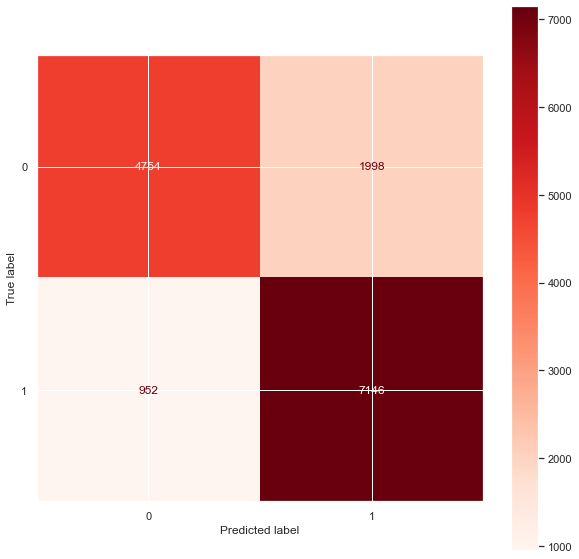

In [19]:
# Visualize confusion matrix
fig, ax = plt.subplots(figsize = (10,10))
plot_confusion_matrix(pipeline_rf_final, X_test, y_test, cmap=plt.cm.Reds, ax=ax)
plt.show();

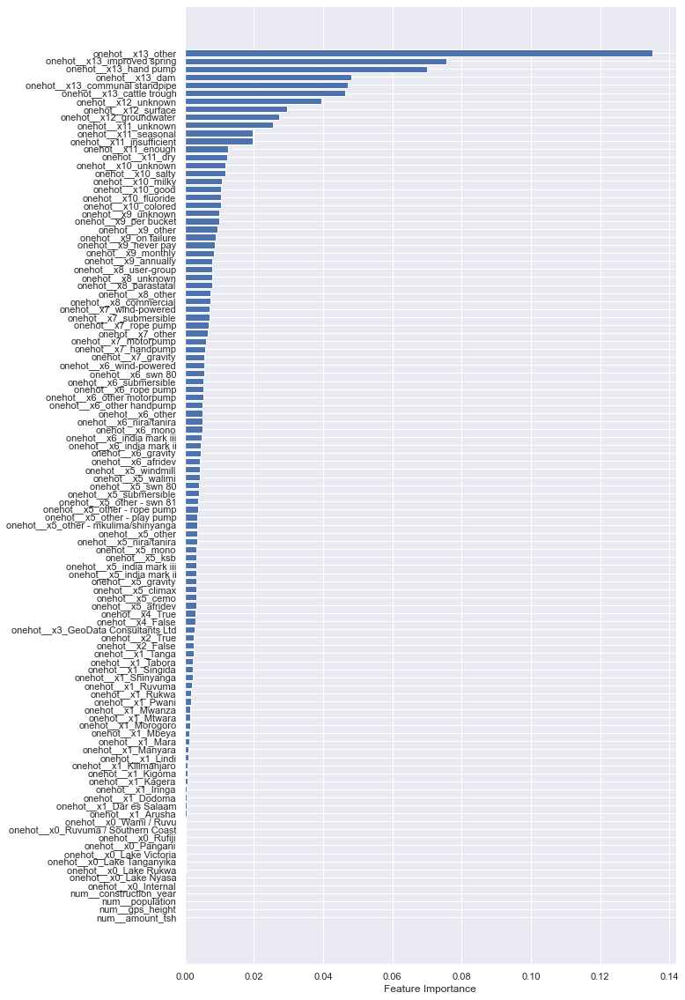

In [20]:
plot_feature_importances(pipeline_rf_final['model'], get_feature_names(pipeline_rf_final['preprocessor']))

Some of the high importance features are 'other' and 'unknown' from which it is difficult to make a qualitative
interpretation. Although, these features seems to help in prediction, a further manual exploration of the different well attributes is needed
to assess the role of quality/type of water pump that needs to be addressed.

### Predict on the test data

In [37]:
test = pd.read_csv('data/Test_set_values.csv')
test_prep = test.drop(cols_to_drop, axis=1)
test_prep = test_prep.reindex(sorted(X.columns), axis=1)
test_prep.head()

,amount_tsh,basin,construction_year,extraction_type,extraction_type_class,extraction_type_group,gps_height,management_group,payment_type,permit,population,public_meeting,quality_group,quantity_group,recorded_by,region,source_class,waterpoint_type_group
0,0.0,Internal,2012,other,other,other,1996,parastatal,never pay,True,321,True,good,seasonal,GeoData Consultants Ltd,Manyara,surface,other
1,0.0,Pangani,2000,gravity,gravity,gravity,1569,user-group,never pay,True,300,True,good,insufficient,GeoData Consultants Ltd,Arusha,groundwater,communal standpipe
2,0.0,Internal,2010,other,other,other,1567,user-group,never pay,NaN,500,True,good,insufficient,GeoData Consultants Ltd,Singida,surface,other
3,0.0,Ruvuma / Southern Coast,1987,other,other,other,267,user-group,unknown,True,250,NaN,good,dry,GeoData Consultants Ltd,Lindi,groundwater,other
4,500.0,Ruvuma / Southern Coast,2000,gravity,gravity,gravity,1260,user-group,monthly,True,60,NaN,good,enough,GeoData Consultants Ltd,Ruvuma,groundwater,communal standpipe


In [38]:
# We will also need to do same for "test" data which is diff. from X_test.
test_preprocess = preprocessor1.transform(test_prep)
test_df_preprocess = pd.DataFrame(test_preprocess.todense(), columns = get_feature_names(preprocessor1))

In [39]:
# Get predictions
final_predict_rf = pipeline_rf_final['model'].predict(test_df_preprocess)
predictions = {'ID': submission.id, 'status_group':final_predict_rf}
submit = pd.DataFrame(predictions)
# submit['status_group'] = submit['status_group'].map({y:x for x, y in label_encoder.items()})
label_decoder = {1:'functional',
                 0:'non functional'}
submit['status_group'] = submit['status_group'].map(label_decoder)

In [40]:
submit.status_group.unique()

array(['functional', 'non functional'], dtype=object)

In [41]:
test['status_group'] = submit['status_group'].astype('category')

In [42]:
location_map(test, 'status_group', title='Predicted Water Pump Status in Tanzania')

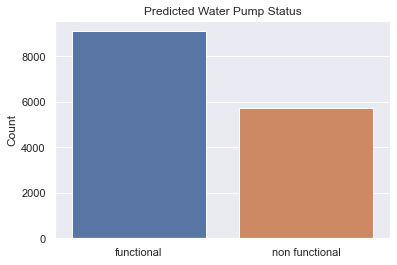

In [43]:
sns.countplot(data=test, x= 'status_group')
plt.title('Predicted Water Pump Status')
plt.xlabel('')
plt.ylabel('Count')
plt.savefig('images/predicted_water_pump_status_count.png')

In [28]:
df_region_pump = test.loc[test['status_group']=='non functional'].groupby(['region'])['status_group'].count().sort_values(ascending=False)
top_failpumps = set(df_region_pump.index[:7])
colors = ['tab:blue' if x in top_failpumps else 'grey' for x in df_region_pump.index]

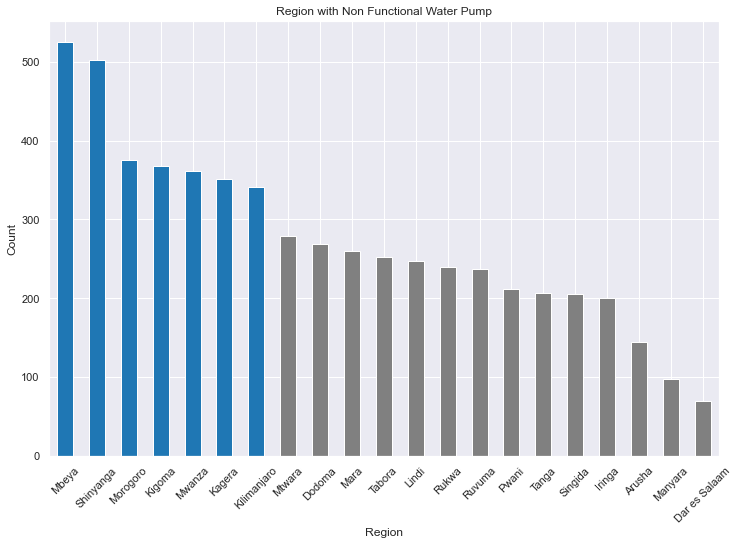

In [33]:
df_region_pump.plot(kind='bar', color = colors, figsize=(12,8))
plt.title('Region with Non Functional Water Pump')
plt.xlabel('Region')
plt.ylabel('Count')
plt.xticks(rotation=45);
plt.savefig('images/Non_functional_pumps_by_Region.png', bbox_inces='tight')

In [34]:
df_region_pop = test.groupby(['region'])['population'].sum().sort_values(ascending=False)
colors = ['tab:blue' if x in top_failpumps else 'grey' for x in df_region_pop.index]

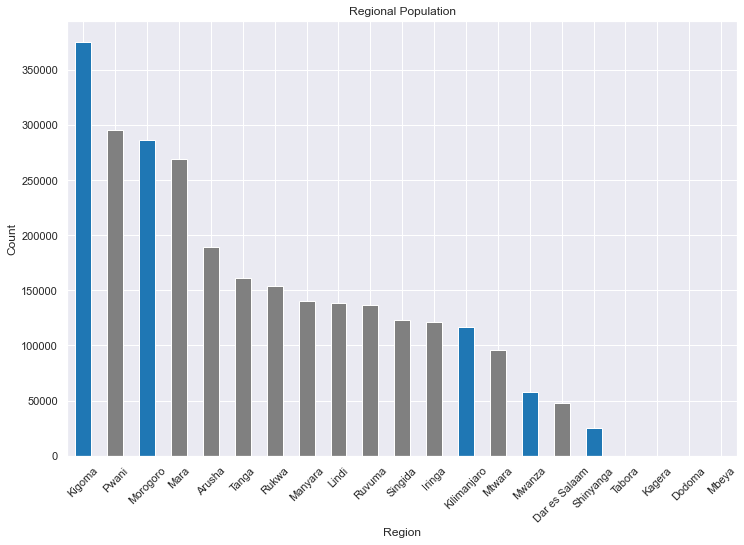

In [35]:
df_region_pop.plot(kind='bar', color = colors, figsize=(12,8))
plt.title('Regional Population')
plt.xlabel('Region')
plt.ylabel('Count')
plt.xticks(rotation=45);
plt.savefig('images/Population_by_Region.png', bbox_inces='tight')

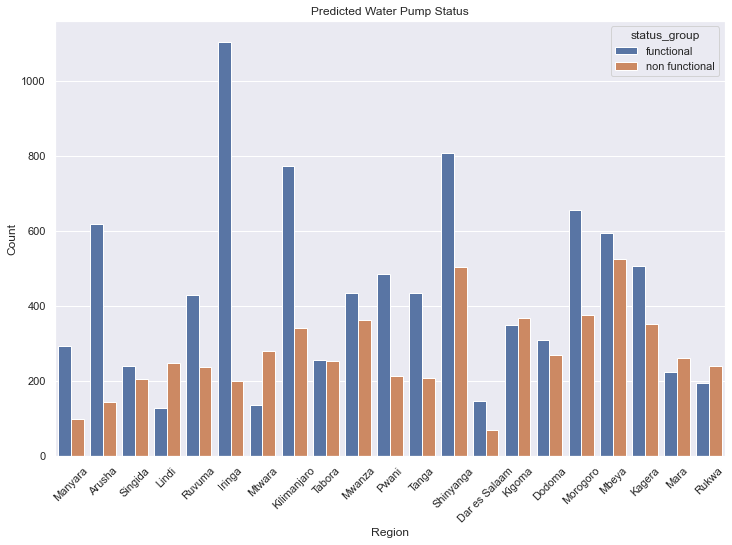

In [44]:
plt.figure(figsize=(12,8))
ax = sns.countplot(data=test.loc[:, ['region', 'status_group']], x='region', hue='status_group')

plt.title('Predicted Water Pump Status')
plt.xlabel('Region')
plt.ylabel('Count')
plt.xticks(rotation=45);
plt.savefig('images/Predicted_Water_Pump_Status_by_Region.png', bbox_inces='tight')

In [168]:
categoric_cols

['basin',
 'region',
 'public_meeting',
 'recorded_by',
 'permit',
 'extraction_type',
 'extraction_type_group',
 'extraction_type_class',
 'management_group',
 'payment_type',
 'quality_group',
 'quantity_group',
 'source_class',
 'waterpoint_type_group']

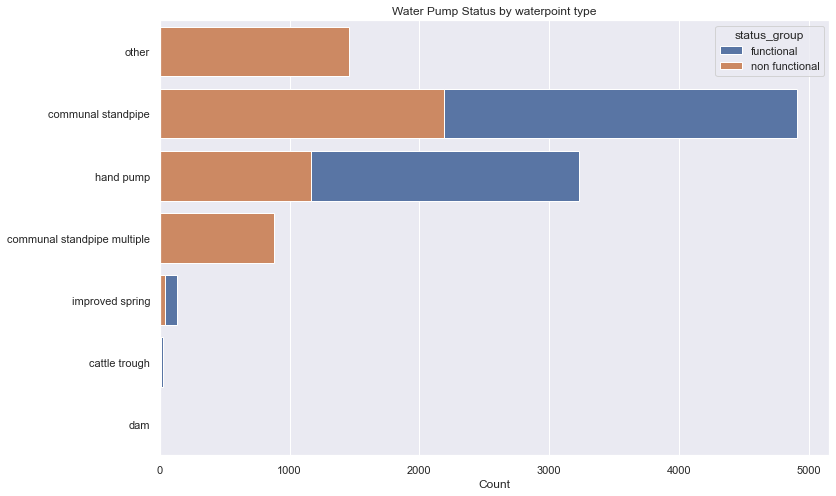

In [45]:
plt.figure(figsize=(12,8))

ax = sns.countplot(data=test.loc[:, ['waterpoint_type', 'status_group']], y='waterpoint_type', orient='h', hue='status_group', dodge=False)
plt.title('Water Pump Status by waterpoint type')
plt.xlabel('Count')
plt.ylabel('')
plt.xticks(rotation=0);
plt.savefig('images/Predicted_Water_Pump_Status_by_waterpoint_type.png', bbox_inces='tight')

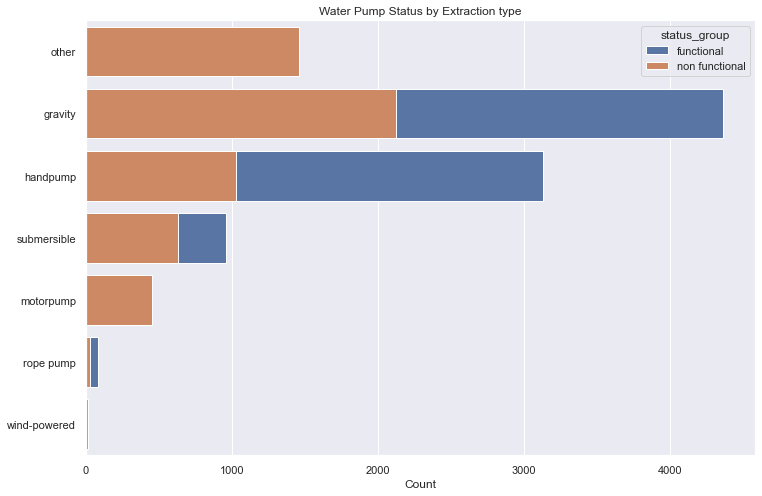

In [46]:
plt.figure(figsize=(12,8))
ax = sns.countplot(data=test.loc[:, ['extraction_type_class', 'status_group']], y='extraction_type_class', orient='h', hue='status_group', dodge=False)
plt.title('Water Pump Status by Extraction type')
plt.xlabel('Count')
plt.ylabel('')
plt.xticks(rotation=0);
plt.savefig('images/Predicted_Water_Pump_Status_by_extraction_type.png', bbox_inces='tight')

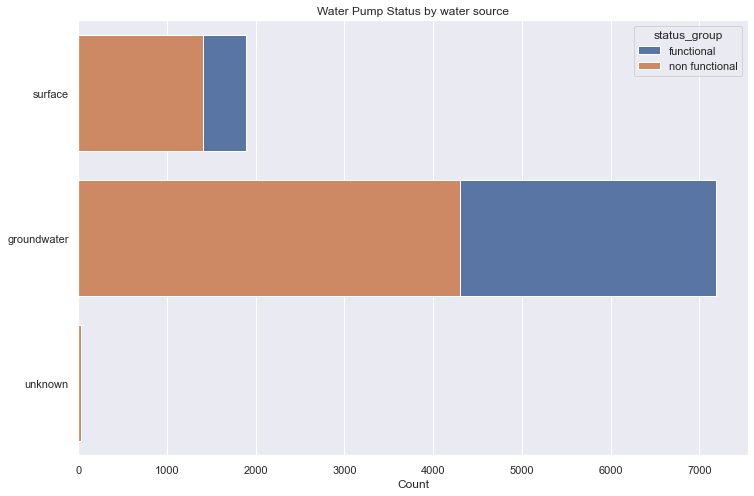

In [205]:
plt.figure(figsize=(12,8))
ax = sns.countplot(data=test.loc[:, ['source_class', 'status_group']], y='source_class', orient='h', hue='status_group', dodge=False)
plt.title('Water Pump Status by water source')
plt.xlabel('Count')
plt.ylabel('')
plt.xticks(rotation=0);
plt.savefig('images/Predicted_Water_Pump_Status_by_water_source.png', bbox_inces='tight')

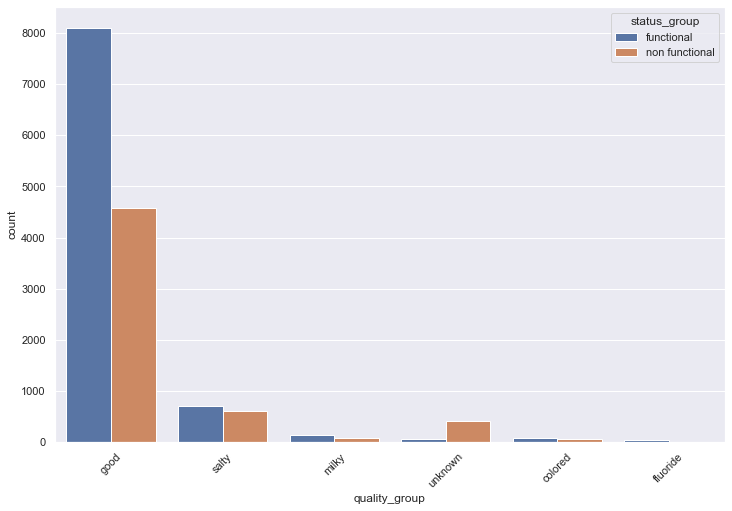

In [183]:
plt.figure(figsize=(12,8))
ax = sns.countplot(data=test.loc[:, ['quality_group', 'status_group']], x='quality_group', hue='status_group')
plt.xticks(rotation=45);

<AxesSubplot:ylabel='waterpoint_type'>

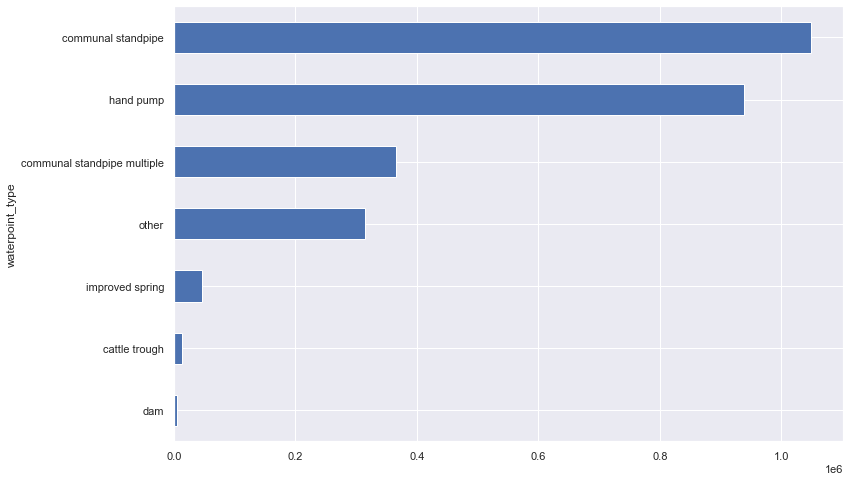

In [214]:
test.groupby('waterpoint_type')['population'].sum().sort_values(ascending=True).plot(kind='barh', figsize=(12,8))


<AxesSubplot:ylabel='extraction_type_class'>

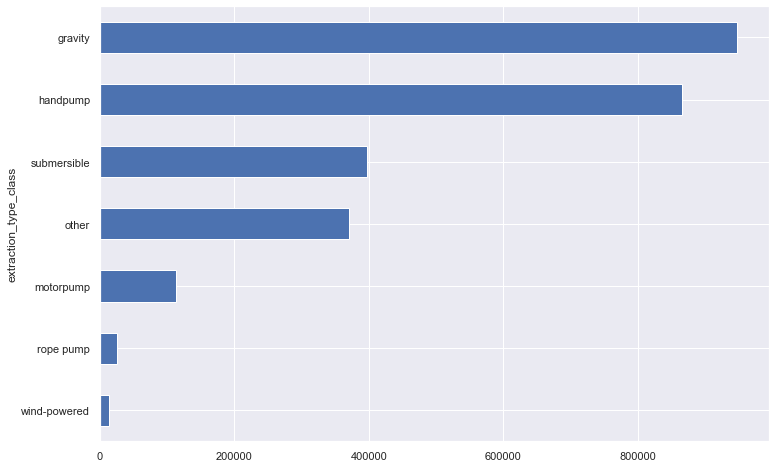

In [211]:
test.groupby('extraction_type_class')['population'].sum().sort_values(ascending=True).plot(kind='barh', figsize=(12,8))


## Conclusion

More than 70% of the test wells have been identified as non-functional pumps.
Priority1: Mibeya, Kigoma, Mara, Rukwa & Lindi has higher number of non-functional pumps that needs to be prioritize first.
Priority2: Morogoro, Killimanjaro & Kagera (based on the population size)

Large proportion of communal stand-pipes with gravity type of pumps are non-functional that needs immediate attention

### Future Recommendation

The current dataset is predominantly consisted of categorical data with some features having 1000s of categories. A more in-depth analysis and suitable encoding method needs to be implemented in order to use those features in meaningful way. 

Things that will help to increase revenue!

## Appendix

### Hyperparameter tuning 1

The first set of parameters we will check will be max_depth, min_samples_split and min_samples_leaf

In [31]:
X_train_preprocess = preprocessor1.fit_transform(X_train)  
X_test_preprocess = preprocessor1.transform(X_test)

In [42]:
rf = RandomForestClassifier(n_estimators = 100, random_state=0)

In [34]:
n_estimators = [100]
max_depth = [40,50,60] 
min_samples_split = [2, 5, 10]   #default = 2
min_samples_leaf = [1, 2, 5]     #default = 1

hyperRF = dict(n_estimators = n_estimators, max_depth = max_depth,  
              min_samples_split = min_samples_split, 
             min_samples_leaf = min_samples_leaf)

gridRF = GridSearchCV(rf, hyperRF, cv = 3, verbose = 1, n_jobs = -2)
bestRF = gridRF.fit(X_train_preprocess, y_train)

Fitting 3 folds for each of 27 candidates, totalling 81 fits


[Parallel(n_jobs=-2)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-2)]: Done  81 out of  81 | elapsed:  4.2min finished


In [35]:
bestRF.cv_results_

{'mean_fit_time': array([33.73797083, 27.89097508, 24.77362084, 21.06633647, 20.48836128,
        19.0345246 , 14.56006821, 14.66868687, 14.66437721, 34.28492928,
        28.38257964, 25.02914921, 21.18680938, 20.65524268, 19.08326538,
        14.62363847, 14.78080217, 14.75354107, 35.22389189, 29.21451116,
        25.58331347, 21.65726582, 21.05157097, 19.70709451, 15.09105007,
        14.41715336, 13.99223256]),
 'std_fit_time': array([0.16687803, 0.09575858, 0.06924785, 0.03683868, 0.04009008,
        0.08204745, 0.00712024, 0.04433955, 0.05479212, 0.01463479,
        0.17569504, 0.21371759, 0.02203203, 0.04474454, 0.10608795,
        0.0476704 , 0.07164947, 0.06655022, 0.11187701, 0.14109148,
        0.22462313, 0.05467814, 0.20808666, 0.10706007, 0.05442647,
        0.03961127, 0.05890085]),
 'mean_score_time': array([0.29471874, 0.27113358, 0.26047707, 0.23821974, 0.23737502,
        0.23123829, 0.20462815, 0.20381761, 0.20645905, 0.30004883,
        0.2859145 , 0.27078263, 0.243

In [36]:
results = pd.concat([pd.DataFrame(bestRF.cv_results_["params"]), 
                     pd.DataFrame(bestRF.cv_results_["mean_test_score"], columns = ["Accuracy"])], axis=1)
results

,max_depth,min_samples_leaf,min_samples_split,n_estimators,Accuracy
0,40,1,2,100,0.777823
1,40,1,5,100,0.783906
2,40,1,10,100,0.786128
3,40,2,2,100,0.785185
4,40,2,5,100,0.783996
5,40,2,10,100,0.780988
6,40,5,2,100,0.773266
7,40,5,5,100,0.773266
8,40,5,10,100,0.773266
9,50,1,2,100,0.776700


In [37]:
print("Best parameters set from training set: ")
print(bestRF.best_params_)
print()
print("Best scores from training set: ")
print(bestRF.best_score_)
print()

Best parameters set from training set: 
{'max_depth': 40, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}

Best scores from training set: 
0.7861279461279462



In [38]:
RandomForestClassifier(**bestRF.best_params_)

RandomForestClassifier(max_depth=40, min_samples_split=10)

In [39]:
# Lets run a Random Forest with above parameters
rf_test1 = RandomForestClassifier(n_estimators = 100,
                                   max_depth = 40,
                                   min_samples_leaf = 1,
                                   min_samples_split = 10, random_state=0)
rf_test1.fit(X_train_preprocess, y_train)

RandomForestClassifier(max_depth=40, min_samples_split=10, random_state=0)

In [40]:
# Get predictions
_, _ = get_prediction(rf_test1, X_train_preprocess, X_test_preprocess, y_train, y_test)

Training Prediction
--------------------
              precision    recall  f1-score   support

           0       0.91      0.83      0.87     17146
           1       0.84      0.95      0.89     24161
           2       0.80      0.37      0.51      3243

    accuracy                           0.86     44550
   macro avg       0.85      0.72      0.75     44550
weighted avg       0.86      0.86      0.85     44550

Test Prediction
--------------------
              precision    recall  f1-score   support

           0       0.83      0.74      0.78      5678
           1       0.78      0.90      0.83      8098
           2       0.54      0.24      0.33      1074

    accuracy                           0.79     14850
   macro avg       0.72      0.62      0.65     14850
weighted avg       0.78      0.79      0.78     14850



In [109]:
# # Cross Validation
# cv = StratifiedKFold(n_splits=5, random_state=42)
# rf2_smote_cv_score = cross_val_score(rf2_smote, X_train_resampled, y_train_resampled, cv = cv)

# print(rf2_smote_cv_score, '\nAverage:', rf2_smote_cv_score.mean())

[0.76836587 0.82203214 0.82658481 0.83043598 0.84050773] 
Average: 0.8175853065283659


Looks like a little bit of overfitting, we will try to reduce the max depth a little bit and test other parameters as well.

### Hyperparameter tuning 2

Next, we will be testing n_estimators and max_features paramters. In earlier tuning test, the best min_sample_split and min_samples_leaf were found to be 5 and 1, which we will be using for next tests. 

In [43]:
n_estimators = [100, 200, 300, 500] 
max_depth = [10, 15, 20, 30, 40] 
min_samples_split = [5, 10]   #default = 2
min_samples_leaf = [1]     #default = 1
#max_features = ['auto', 'sqrt', 'log2']
#max_leaf_nodes = []

hyperRF2 = dict(n_estimators = n_estimators, max_depth = max_depth,  
              min_samples_split = min_samples_split, 
             min_samples_leaf = min_samples_leaf)

gridRF = GridSearchCV(rf, hyperRF2, cv = 3, verbose = 1, n_jobs = -2)
bestRF = gridRF.fit(X_train_preprocess, y_train)

Fitting 3 folds for each of 40 candidates, totalling 120 fits


[Parallel(n_jobs=-2)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-2)]: Done 120 out of 120 | elapsed: 16.3min finished


In [44]:
results = pd.concat([pd.DataFrame(bestRF.cv_results_["params"]), 
                     pd.DataFrame(bestRF.cv_results_["mean_test_score"], columns = ["Accuracy"])], axis=1)
results

,max_depth,min_samples_leaf,min_samples_split,n_estimators,Accuracy
0,10,1,5,100,0.738586
1,10,1,5,200,0.739102
2,10,1,5,300,0.739304
3,10,1,5,500,0.739237
4,10,1,10,100,0.738249
5,10,1,10,200,0.737980
6,10,1,10,300,0.738653
7,10,1,10,500,0.738272
8,15,1,5,100,0.772525
9,15,1,5,200,0.772525


In [45]:
print("Best parameters set from training set: ")
print(bestRF.best_params_)
print()
print("Best scores from training set: ")
print(bestRF.best_score_)
print()

Best parameters set from training set: 
{'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 500}

Best scores from training set: 
0.7864197530864198



In [46]:
# Lets run a Random Forest with above parameters
rf_test2 = RandomForestClassifier(n_estimators = 500,
                                   max_depth = 30,
                                   min_samples_leaf = 1,
                                   min_samples_split = 10, random_state=0)
rf_test2.fit(X_train_preprocess, y_train)

RandomForestClassifier(max_depth=30, min_samples_split=10, n_estimators=500,
                       random_state=0)

In [47]:
# Get predictions
_, _ = get_prediction(rf_test2, X_train_preprocess, X_test_preprocess, y_train, y_test)

Training Prediction
--------------------
              precision    recall  f1-score   support

           0       0.91      0.82      0.86     17146
           1       0.83      0.95      0.89     24161
           2       0.79      0.36      0.50      3243

    accuracy                           0.86     44550
   macro avg       0.85      0.71      0.75     44550
weighted avg       0.86      0.86      0.85     44550

Test Prediction
--------------------
              precision    recall  f1-score   support

           0       0.83      0.74      0.78      5678
           1       0.78      0.90      0.83      8098
           2       0.55      0.24      0.33      1074

    accuracy                           0.79     14850
   macro avg       0.72      0.62      0.65     14850
weighted avg       0.78      0.79      0.78     14850



We can see that there is no major improvement in the model performance with increasing n_estimators. Though, a fraction of improvement from 100 to 300. So for the future test, we will keep this number to 300, as higher number will only increase the runtime. The maximum depth of 30 and higher seems to be quite big. The next test, we will evaluate max_features.

In [48]:
n_estimators = [300]
max_depth = [30] 
min_samples_split = [10]   #default = 2
min_samples_leaf = [1]     #default = 1
max_features = ['auto', 'sqrt', 'log2', None]

hyperRF3 = dict(n_estimators = n_estimators, max_depth = max_depth,  
              min_samples_split = min_samples_split, 
              min_samples_leaf = min_samples_leaf,
              max_features = max_features
              )

gridRF = GridSearchCV(rf, hyperRF3, cv = 3, verbose = 1, n_jobs = -2)
bestRF = gridRF.fit(X_train_preprocess, y_train)

Fitting 3 folds for each of 4 candidates, totalling 12 fits


[Parallel(n_jobs=-2)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done  12 out of  12 | elapsed:  5.9min remaining:    0.0s
[Parallel(n_jobs=-2)]: Done  12 out of  12 | elapsed:  5.9min finished


In [49]:
results = pd.concat([pd.DataFrame(bestRF.cv_results_["params"]), 
                     pd.DataFrame(bestRF.cv_results_["mean_test_score"], columns = ["Accuracy"])], axis=1)
results

,max_depth,max_features,min_samples_leaf,min_samples_split,n_estimators,Accuracy
0,30,auto,1,10,300,0.785814
1,30,sqrt,1,10,300,0.785814
2,30,log2,1,10,300,0.785589
3,30,None,1,10,300,0.782536


In [50]:
print("Best parameters set from training set: ")
print(bestRF.best_params_)
print()
print("Best scores from training set: ")
print(bestRF.best_score_)
print()

Best parameters set from training set: 
{'max_depth': 30, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 300}

Best scores from training set: 
0.785813692480359



Looks like no major differences in the max_features parameters. We will leave it as default, which is "auto". Next, we will test max_leaf_nodes parameter.In general, if the max_leaf_nodes is very small, the model will likely to underfit. Let see if this holds true.

In [127]:
n_estimators = [300]
max_depth = [30] 
min_samples_split = [10]   #default = 2
min_samples_leaf = [1]     #default = 1
max_leaf_nodes = [2, 5, 10, 50, 100, 200, 500, 1000]

hyperRF4 = dict(n_estimators = n_estimators, max_depth = max_depth,  
              min_samples_split = min_samples_split, 
              min_samples_leaf = min_samples_leaf,
              max_leaf_nodes = max_leaf_nodes
              )

gridRF = GridSearchCV(rf, hyperRF4, cv = 3, verbose = 1, n_jobs = -1)
bestRF = gridRF.fit(X_train_preprocess, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 out of  24 | elapsed:   53.0s finished


In [128]:
results = pd.concat([pd.DataFrame(bestRF.cv_results_["params"]), 
                     pd.DataFrame(bestRF.cv_results_["mean_test_score"], columns = ["Accuracy"])], axis=1)
results

,max_depth,max_leaf_nodes,min_samples_leaf,min_samples_split,n_estimators,Accuracy
0,30,2,1,5,300,0.554585
1,30,5,1,5,300,0.587531
2,30,10,1,5,300,0.607066
3,30,50,1,5,300,0.647642
4,30,100,1,5,300,0.678987
5,30,200,1,5,300,0.712788
6,30,500,1,5,300,0.748727
7,30,1000,1,5,300,0.772719


In [129]:
print("Best parameters set from training set: ")
print(bestRF.best_params_)
print()
print("Best scores from training set: ")
print(bestRF.best_score_)
print()

Best parameters set from training set: 
{'max_depth': 30, 'max_leaf_nodes': 1000, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 300}

Best scores from training set: 
0.7727191203454602



Looks like our initial assumption is true. However, the max value of 1000 hasn't achieved the score as in the default parameter. It will be interesting to know why such a large value is required, is it because we have huge amount of categorical features. Anyway, we will leave this parameter to default again. Finally, we would like to test the criterion: gini vs entropy. I assume there will be no major difference. For the sanity test, we will do it.

In [131]:
n_estimators = [300]
criterion = ['gini', 'entropy']

hyperRF = dict(n_estimators = n_estimators, 
               criterion = criterion,
               max_depth = [30], 
               min_samples_split = [5], 
               min_samples_leaf = [1]          
              )

gridRF = GridSearchCV(rf_smote, hyperRF, cv = 3, verbose = 1, n_jobs = -1)
bestRF = gridRF.fit(X_train_resampled, y_train_resampled)

Fitting 3 folds for each of 2 candidates, totalling 6 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed:   33.7s finished


In [132]:
results = pd.concat([pd.DataFrame(bestRF.cv_results_["params"]), 
                     pd.DataFrame(bestRF.cv_results_["mean_test_score"], columns = ["Accuracy"])], axis=1)
results

,criterion,max_depth,min_samples_leaf,min_samples_split,n_estimators,Accuracy
0,gini,30,1,5,300,0.810604
1,entropy,30,1,5,300,0.810493


Yup, not a significant difference. Our rf_test2 is by far performing the best. 

### XGBoost

In [ ]:
# Train

In [41]:
# Instantiate a XGBoost classifier
# We will enable gpu for xgboost 
xgb_smote = XGBClassifier(learning_rate =0.1, n_estimators=100, max_depth=5,
                    min_child_weight=1, gamma=0, subsample=0.6, 
                    colsample_bytree=0.6, reg_alpha=0, reg_lambda=1, 
                    objective='multi:softmax', nthread=os.cpu_count(), 
                    tree_method='gpu_hist', seed=100)

xgb_smote.fit(X_train_resampled, y_train_resampled)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.6, gamma=0, gpu_id=0,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=nan,
              monotone_constraints='(0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0)',
              n_estimators=100, n_jobs=8, nthread=8, num_parallel_tree=1,
              objective='multi:softprob', random_state=100, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, seed=100, subsample=0.6,
              tree_method='gpu_hist', validate_parameters=1, verbosity=None)

In [ ]:
# Get predictions
y_train_pred_xgb_smote, y_test_pred_xgb_smote = get_prediction(xgb_smote, X_train_resampled, preprocess_test,
                                                        y_train_resampled, y_test)

### Feature Engineering

In [70]:
X_feat = train.copy(deep=True)
X_feat['age'] = 2021 - X_feat['construction_year']
X_feat['age'] = X_feat['age'].replace(to_replace=2021, value=0)
X_feat['age_recorded'] = 2021 - pd.to_datetime(X_feat['date_recorded'], 
                                    infer_datetime_format=True).apply(lambda x: x.year)


cols_large_categ_feat =  ['lga', 'date_recorded', 'funder', 'ward', 'installer', 
                     'scheme_name', 'subvillage', 'wpt_name'] 

numeric_cols_to_drop_feat = ['num_private', 'region_code', 'district_code', 'id',
                       'construction_year']

redundant_cols_feat = ['quantity', 'water_quality', 'management', 'scheme_management', 'waterpoint_type', 
                     'source', 'source_type', 'payment']

cols_to_drop_feat = cols_large_categ_feat + numeric_cols_to_drop_feat + redundant_cols_feat

X_feat.drop(cols_to_drop, axis=1, inplace=True)
X_feat = X_feat.reindex(sorted(X_feat.columns), axis=1)

numeric_cols_feat = [col for col in X_feat.columns if
                  X_feat[col].dtype in ['int64', 'float64']]
categoric_cols_feat = [col for col in X_feat.columns if X_feat[col].dtype == 'object']



# Train-test split
X_feat_train, X_feat_test, y_feat_train, y_feat_test = train_test_split(X_feat, y, random_state=42)
X_feat_train.shape, X_feat_test.shape, y_feat_train.shape, y_feat_test.shape

((44550, 21), (14850, 21), (44550,), (14850,))

In [72]:
# Preprocessing for numerical data

numerical_transformer_feat = Pipeline(steps=[
    ('imputer', SimpleImputer(missing_values=np.nan, strategy = 'median')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data with One_hot_encoding

categorical_transformer_feat = Pipeline(steps=[
   ('imputer', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
   ('onehot', OneHotEncoder(handle_unknown = 'error'))
])

# Bundle preprocessing for numerical and categorical data
preprocessor_feat = ColumnTransformer(
                   transformers=[
                       ('num', numerical_transformer_feat, numeric_cols_feat),
                       ('cat', categorical_transformer_feat, categoric_cols_feat)
                       ]
    )

In [73]:
# Instantiate a Random Forest Object
rf_feat = RandomForestClassifier(n_estimators = 500, 
                            max_depth=20,
                            min_samples_leaf=1,
                            min_samples_split=10,
                            random_state=0)

# Bundle preprocessing and modeling code in a pipeline
pipeline_rf_feat = Pipeline(steps=[
    ('preprocessor', preprocessor_feat),
    ('model', rf_feat)
    ])

# Preprocessing of training data, fit model 
pipeline_rf_feat.fit(X_feat_train, y_feat_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['age', 'age_recorded',
                                                   'amount_tsh', 'gps_height',
                                                   'latitude', 'longitude',
                                                   'population']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder())]),
                                                  ['basin', 'extraction_type',
                                                   'extraction_type_class',
                                                   'extraction_type_group',
                                                   'management_group',
                                                   'payment_type', 'permit',
                                                   'public_meeting',
                                                   'quality_group',
                                                   'quantity_group',
                                                   'recorded_by', 'region',
                                                   'source_class',
                                                   'waterpoint_type_group'])])),
                ('model',
                 RandomForestClassifier(max_depth=20, min_samples_split=10,
                                        n_estimators=500, random_state=0))])

In [84]:
# Get predictions
_, _ = get_prediction(pipeline_rf_feat, X_feat_train, X_feat_test, y_feat_train, y_feat_test)

Training Prediction
--------------------
                         precision    recall  f1-score   support

             functional       0.82      0.97      0.89     24161
functional needs repair       0.85      0.32      0.46      3243
         non functional       0.93      0.80      0.86     17146

               accuracy                           0.86     44550
              macro avg       0.87      0.69      0.74     44550
           weighted avg       0.86      0.86      0.85     44550

Test Prediction
--------------------
                         precision    recall  f1-score   support

             functional       0.77      0.92      0.84      8098
functional needs repair       0.62      0.21      0.32      1074
         non functional       0.86      0.73      0.79      5678

               accuracy                           0.80     14850
              macro avg       0.75      0.62      0.65     14850
           weighted avg       0.79      0.80      0.78     14850



There is no difference in accuracy and other score after feature engineering.